Kelompok 7
1. Hesti Rara Anjani (23031554023)
2. Danisa Ariatna Putri (23031554048)

# ekstrak file dan menampilkan sample dataset

In [ ]:
# from google.colab import files
# uploaded = files.upload()

In [ ]:
import zipfile
import os

zip_path = "/content/5 celebrity faces dataset.zip"  # ganti sesuai nama file zip
extract_path = "dataset pcd"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("File berhasil diekstrak ke folder:", extract_path)


File berhasil diekstrak ke folder: dataset pcd


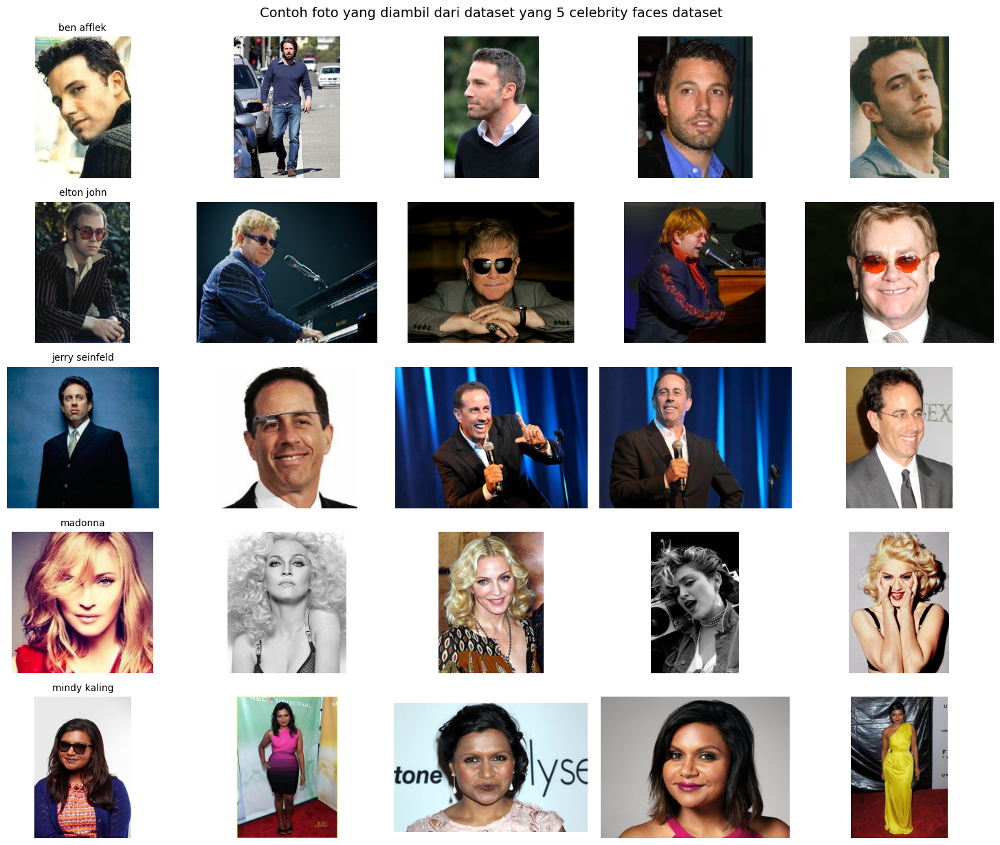

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from glob import glob

# Path ke dataset
base_path = '/content/dataset pcd'

# Daftar folder selebritas (kelas)
class_names = ['ben_afflek', 'elton_john', 'jerry_seinfeld', 'madonna', 'mindy_kaling']

# Jumlah gambar per kelas yang ingin ditampilkan
images_per_class = 5

# Ukuran grid
plt.figure(figsize=(15, len(class_names) * 2.5))

# Loop setiap kelas dan tampilkan gambar
for col, class_name in enumerate(class_names):
    folder_path = os.path.join(base_path, class_name)
    image_paths = glob(os.path.join(folder_path, '*.jpg'))

    # Pastikan ada gambar di folder
    for row in range(images_per_class):
        index = col * images_per_class + row + 1
        if row < len(image_paths):
            img = cv2.imread(image_paths[row])
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.subplot(images_per_class, len(class_names), index)
            plt.imshow(img)
            if row == 0:
                plt.title(class_name.replace('_', ' '), fontsize=10)
            plt.axis('off')

plt.suptitle("Contoh foto yang diambil dari dataset yang 5 celebrity faces dataset", fontsize=14)
plt.tight_layout()
plt.show()


In [ ]:
# import shutil
# import os

# folder_path = "dataset pcd"  # folder yang ingin dihapus

# # Periksa apakah folder ada, lalu hapus
# if os.path.exists(folder_path):
#     shutil.rmtree(folder_path)
#     print(f"Folder '{folder_path}' berhasil dihapus.")
# else:
#     print(f"Folder '{folder_path}' tidak ditemukan.")


# EDA


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from glob import glob
from sklearn.decomposition import PCA

# Path ke dataset
base_path = '/content/dataset pcd'

# Ambil semua kelas (folder)
class_names = os.listdir(base_path)

In [ ]:
# Path ke dataset
df = '/content/dataset pcd'

# Ambil semua kelas (folder)
class_names = os.listdir(base_path)

Jumlah Gambar per Kelas:
- jerry_seinfeld: 21 gambar
- elton_john: 17 gambar
- ben_afflek: 14 gambar
- madonna: 19 gambar
- mindy_kaling: 22 gambar

Total Seluruh Gambar: 93 gambar


<ipython-input-195-870887662>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(data_distribution.keys()), y=list(data_distribution.values()), palette='Set2')


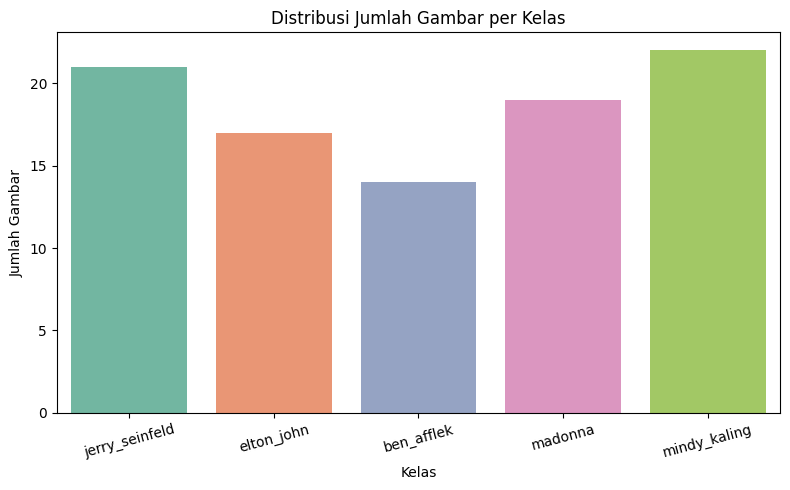

In [ ]:
# 1. Hitung jumlah gambar per kelas dan visualisasi

# Hitung jumlah gambar per kelas
data_distribution = {}

for class_name in class_names:
    folder_path = os.path.join(base_path, class_name)
    image_paths = glob(os.path.join(folder_path, '*.jpg'))
    data_distribution[class_name] = len(image_paths)

# Tampilkan hasil jumlah gambar per kelas
print("Jumlah Gambar per Kelas:")
for class_name, count in data_distribution.items():
    print(f"- {class_name}: {count} gambar")

# Hitung total gambar di seluruh kelas
total_images = sum(data_distribution.values())
print(f"\nTotal Seluruh Gambar: {total_images} gambar")

# Visualisasi dengan bar chart
plt.figure(figsize=(8, 5))
sns.barplot(x=list(data_distribution.keys()), y=list(data_distribution.values()), palette='Set2')
plt.title("Distribusi Jumlah Gambar per Kelas")
plt.xlabel("Kelas")
plt.ylabel("Jumlah Gambar")
plt.xticks(rotation=15)
plt.tight_layout()
plt.show()


Jumlah gambar: 93
Rata-rata ukuran: 279 x 247
Ukuran minimum: 140 x 115
Ukuran maksimum: 380 x 360


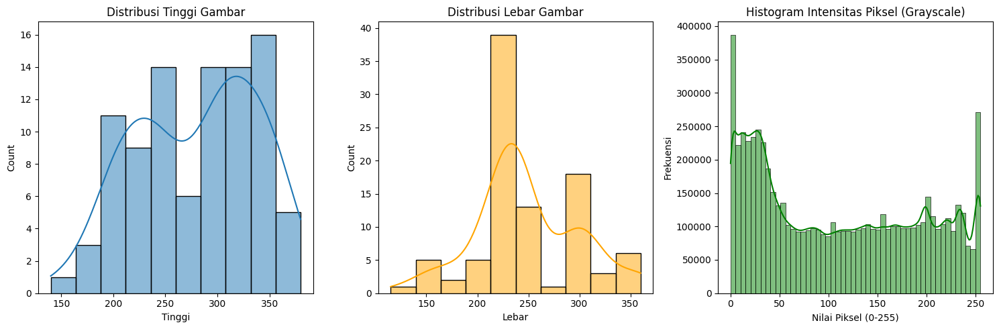

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from glob import glob

# Path dataset
base_path = '/content/dataset pcd'

# Ambil semua path gambar
image_paths = glob(os.path.join(base_path, '*', '*.jpg'))

# Simpan tinggi, lebar, dan rata-rata intensitas piksel
heights, widths = [], []
avg_pixels, all_pixels = [], []

for path in image_paths:
    img = cv2.imread(path)
    if img is not None:
        h, w = img.shape[:2]
        heights.append(h)
        widths.append(w)

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        avg_pixels.append(np.mean(gray))
        all_pixels.extend(gray.flatten())

# Statistik ukuran gambar
print(f"Jumlah gambar: {len(image_paths)}")
print(f"Rata-rata ukuran: {int(np.mean(heights))} x {int(np.mean(widths))}")
print(f"Ukuran minimum: {min(heights)} x {min(widths)}")
print(f"Ukuran maksimum: {max(heights)} x {max(widths)}")

# Visualisasi histogram ukuran dan piksel
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.histplot(heights, kde=True, bins=10)
plt.title("Distribusi Tinggi Gambar")
plt.xlabel("Tinggi")

plt.subplot(1, 3, 2)
sns.histplot(widths, kde=True, bins=10, color='orange')
plt.title("Distribusi Lebar Gambar")
plt.xlabel("Lebar")

plt.subplot(1, 3, 3)
sns.histplot(all_pixels, bins=50, kde=True, color='green')
plt.title("Histogram Intensitas Piksel (Grayscale)")
plt.xlabel("Nilai Piksel (0-255)")
plt.ylabel("Frekuensi")

plt.tight_layout()
plt.show()


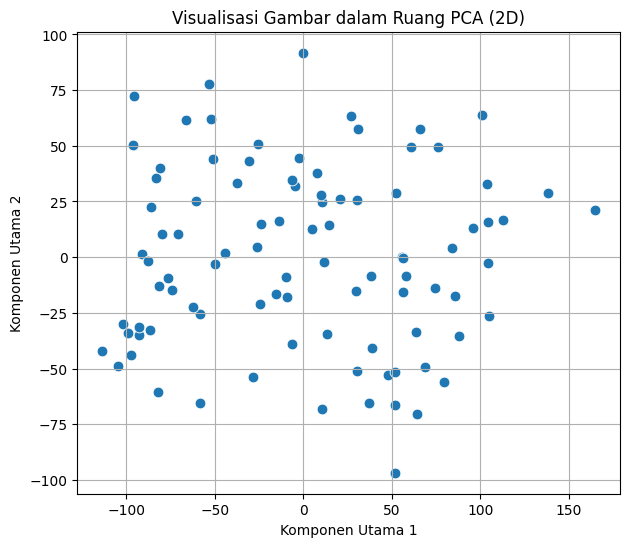

Variansi total yang dijelaskan oleh 2 komponen pertama: 37.75%


In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Resize semua gambar ke 128x128, konversi grayscale, flatten
image_size = 128
X = []

for path in image_paths:
    img = cv2.imread(path)
    if img is not None:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        resized = cv2.resize(gray, (image_size, image_size))
        X.append(resized.flatten())

X = np.array(X)

# Standarisasi sebelum PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Jalankan PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Visualisasi PCA
plt.figure(figsize=(7, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], s=60)
plt.title("Visualisasi Gambar dalam Ruang PCA (2D)")
plt.xlabel("Komponen Utama 1")
plt.ylabel("Komponen Utama 2")
plt.grid(True)
plt.show()

# Variansi yang dijelaskan
print(f"Variansi total yang dijelaskan oleh 2 komponen pertama: {np.sum(pca.explained_variance_ratio_)*100:.2f}%")


# preprocessing

resize

In [ ]:
import shutil
import os
import cv2
from glob import glob

input_base = "/content/dataset pcd"  # ganti dengan folder dataset asli kamu
output_base = "/content/preprocessed_dataset"

# hapus folder preprocessed_dataset lama jika ada
if os.path.exists(output_base):
    shutil.rmtree(output_base)
    print(f"Folder {output_base} dihapus.")

# buat folder baru
os.makedirs(output_base, exist_ok=True)

# ambil list kelas
classes = sorted([d for d in os.listdir(input_base) if os.path.isdir(os.path.join(input_base, d))])
print(f"Kelas ditemukan: {classes}")

# preprocessing: resize dan simpan gambar
for class_name in classes:
    input_class_dir = os.path.join(input_base, class_name)
    output_class_dir = os.path.join(output_base, class_name)
    os.makedirs(output_class_dir, exist_ok=True)

    image_paths = glob(os.path.join(input_class_dir, "*.*"))
    for img_path in image_paths:
        img = cv2.imread(img_path)
        if img is None:
            print(f"Gagal baca: {img_path}")
            continue
        img_resized = cv2.resize(img, (128, 128))
        save_path = os.path.join(output_class_dir, os.path.basename(img_path))
        cv2.imwrite(save_path, img_resized)

print("Preprocessing selesai, gambar sudah diresize dan disimpan di:", output_base)


Folder /content/preprocessed_dataset dihapus.
Kelas ditemukan: ['ben_afflek', 'elton_john', 'jerry_seinfeld', 'madonna', 'mindy_kaling']
Preprocessing selesai, gambar sudah diresize dan disimpan di: /content/preprocessed_dataset


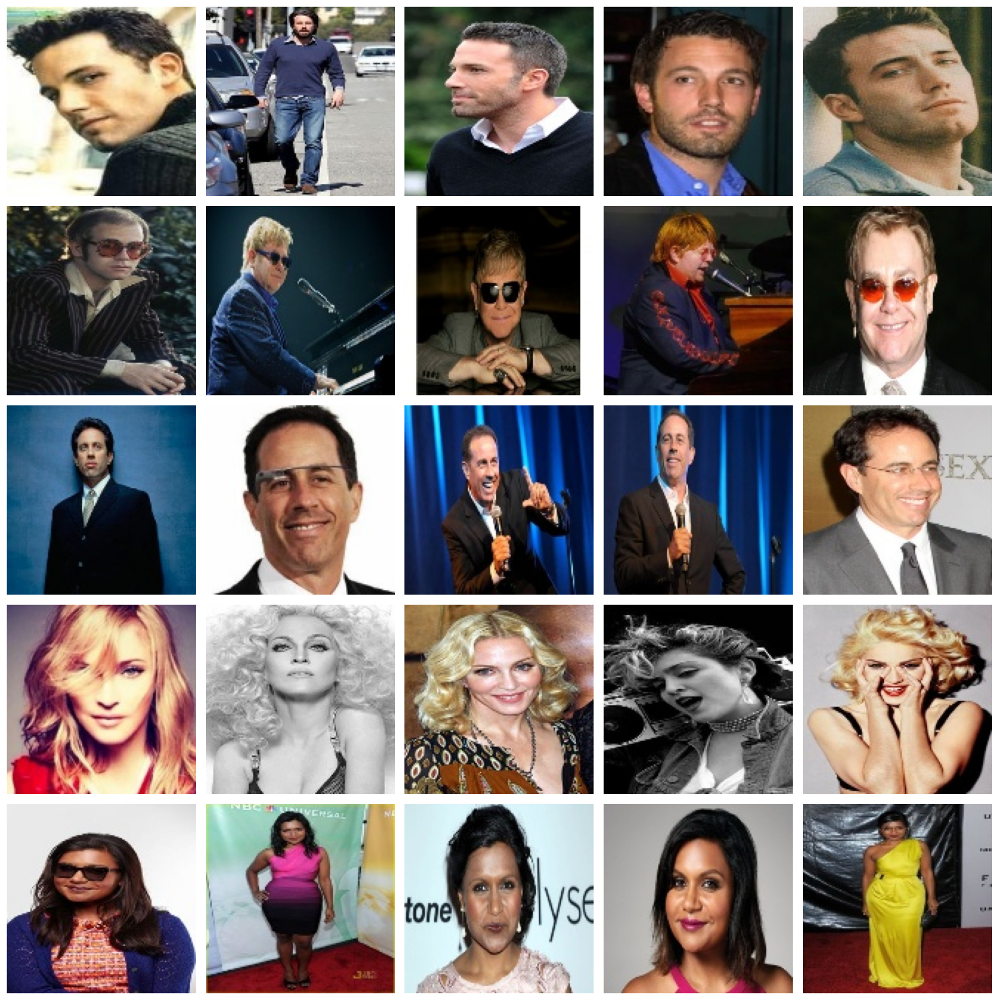

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os
from glob import glob

output_base = "/content/preprocessed_dataset"

classes = sorted([d for d in os.listdir(output_base) if os.path.isdir(os.path.join(output_base, d))])

num_images_to_show = 5
plt.figure(figsize=(15, len(classes)*3))

img_idx = 1
for class_name in classes:
    class_dir = os.path.join(output_base, class_name)
    image_paths = glob(os.path.join(class_dir, "*.*"))

    for i in range(min(num_images_to_show, len(image_paths))):
        img = cv2.imread(image_paths[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(len(classes), num_images_to_show, img_idx)
        plt.imshow(img)
        plt.axis('off')
        if i == 0:
            plt.ylabel(class_name, fontsize=12)
        img_idx += 1

plt.tight_layout()
plt.show()


# augmentasi

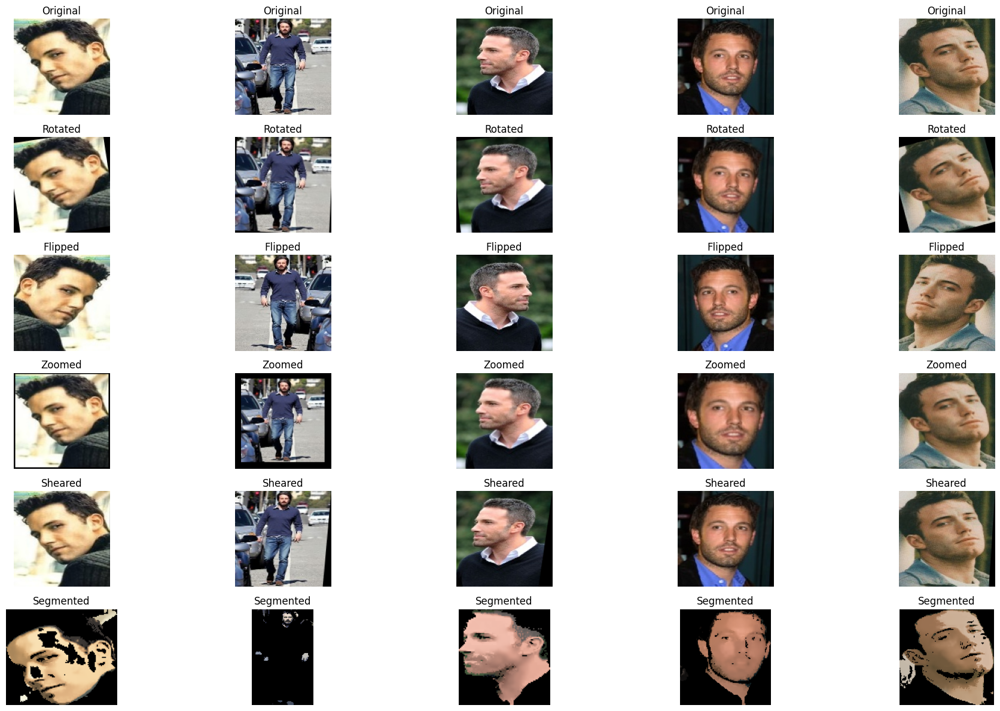

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import os
from glob import glob

# fungsi augmentasi dan segmentasi
def random_rotate(image, angle_range=20):
    angle = random.uniform(-angle_range, angle_range)
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h))
    return rotated

def horizontal_flip(image):
    return cv2.flip(image, 1)

def random_zoom(image, zoom_range=(0.8, 1.2)):
    zoom_factor = random.uniform(*zoom_range)
    h, w = image.shape[:2]
    new_h, new_w = int(h * zoom_factor), int(w * zoom_factor)
    zoomed = cv2.resize(image, (new_w, new_h))
    if zoom_factor < 1.0:
        pad_h = (h - new_h) // 2
        pad_w = (w - new_w) // 2
        zoomed = cv2.copyMakeBorder(zoomed, pad_h, h-new_h-pad_h, pad_w, w-new_w-pad_w, cv2.BORDER_CONSTANT)
    else:
        start_h = (new_h - h) // 2
        start_w = (new_w - w) // 2
        zoomed = zoomed[start_h:start_h+h, start_w:start_w+w]
    return zoomed

def random_shear(image, shear_range=0.2):
    h, w = image.shape[:2]
    shear_factor = random.uniform(-shear_range, shear_range)
    M = np.array([[1, shear_factor, 0],
                  [0, 1, 0]], dtype=np.float32)
    sheared = cv2.warpAffine(image, M, (w, h))
    return sheared

def segment_skin_meanshift(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lower = np.array([0, 40, 60], dtype=np.uint8)
    upper = np.array([20, 150, 255], dtype=np.uint8)
    mask = cv2.inRange(hsv, lower, upper)
    shifted = cv2.pyrMeanShiftFiltering(image, sp=21, sr=51)
    skin = cv2.bitwise_and(shifted, shifted, mask=mask)
    coords = cv2.findNonZero(mask)
    if coords is not None:
        x, y, w, h = cv2.boundingRect(coords)
        cropped = skin[y:y+h, x:x+w]
    else:
        cropped = image
    return cropped

sample_folder = "/content/preprocessed_dataset/ben_afflek"
image_paths = glob(os.path.join(sample_folder, "*.*"))[:5]

plt.figure(figsize=(20, 12))

for i, img_path in enumerate(image_paths):
    img = cv2.imread(img_path)

    # buat versi RGB untuk matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # augmentasi
    rotated_img = random_rotate(img)
    flipped_img = horizontal_flip(img)
    zoomed_img = random_zoom(img)
    sheared_img = random_shear(img)
    segmented_img = segment_skin_meanshift(img)

    # konversi ke RGB
    rotated_rgb = cv2.cvtColor(rotated_img, cv2.COLOR_BGR2RGB)
    flipped_rgb = cv2.cvtColor(flipped_img, cv2.COLOR_BGR2RGB)
    zoomed_rgb = cv2.cvtColor(zoomed_img, cv2.COLOR_BGR2RGB)
    sheared_rgb = cv2.cvtColor(sheared_img, cv2.COLOR_BGR2RGB)
    segmented_rgb = cv2.cvtColor(segmented_img, cv2.COLOR_BGR2RGB)

    # baris 1: Original
    plt.subplot(6, 5, i+1)
    plt.imshow(img_rgb)
    if i == 0: plt.ylabel("Original", fontsize=14)
    plt.title('Original')
    plt.axis('off')

    # baris 2: Rotated
    plt.subplot(6, 5, i+6)
    plt.imshow(rotated_rgb)
    if i == 0: plt.ylabel("Rotate", fontsize=14)
    plt.title('Rotated')
    plt.axis('off')

    # Baris 3: Flipped
    plt.subplot(6, 5, i+11)
    plt.imshow(flipped_rgb)
    if i == 0: plt.ylabel("Flip", fontsize=14)
    plt.title('Flipped')
    plt.axis('off')

    # baris 4: Zoomed
    plt.subplot(6, 5, i+16)
    plt.imshow(zoomed_rgb)
    if i == 0: plt.ylabel("Zoom", fontsize=14)
    plt.title('Zoomed')
    plt.axis('off')

    # baris 5: Sheared
    plt.subplot(6, 5, i+21)
    plt.imshow(sheared_rgb)
    if i == 0: plt.ylabel("Shear", fontsize=14)
    plt.title('Sheared')
    plt.axis('off')

    # baris 6: Segmented
    plt.subplot(6, 5, i+26)
    plt.imshow(segmented_rgb)
    if i == 0: plt.ylabel("Segmented", fontsize=14)
    plt.title('Segmented')
    plt.axis('off')

plt.tight_layout()
plt.show()


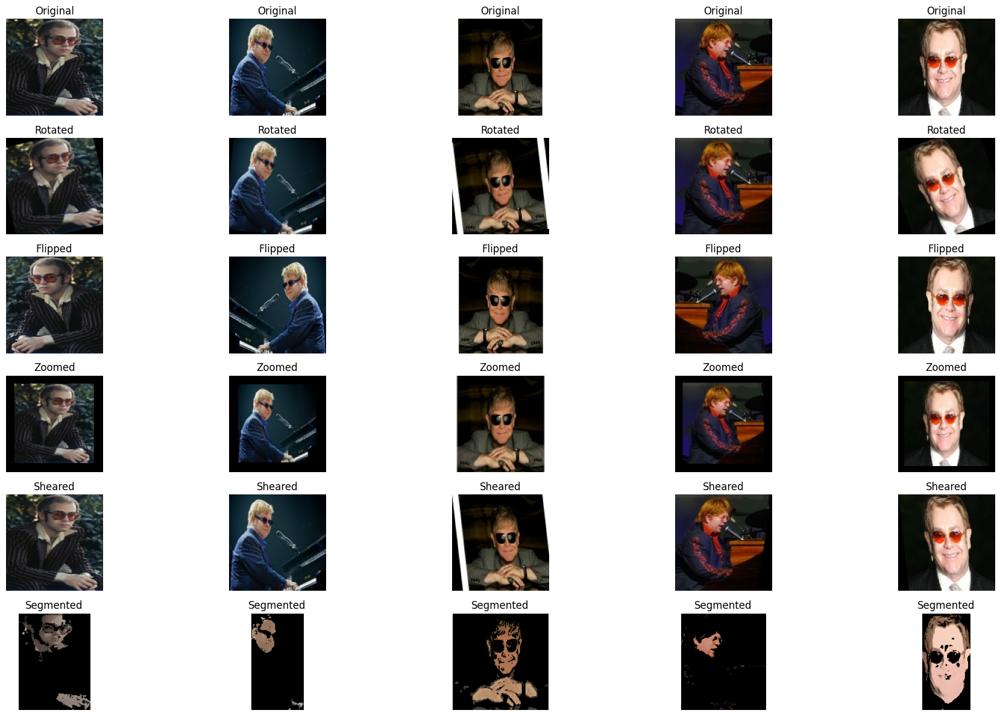

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import os
from glob import glob

# fungsi augmentasi dan segmentasi
def random_rotate(image, angle_range=20):
    angle = random.uniform(-angle_range, angle_range)
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h))
    return rotated

def horizontal_flip(image):
    return cv2.flip(image, 1)

def random_zoom(image, zoom_range=(0.8, 1.2)):
    zoom_factor = random.uniform(*zoom_range)
    h, w = image.shape[:2]
    new_h, new_w = int(h * zoom_factor), int(w * zoom_factor)
    zoomed = cv2.resize(image, (new_w, new_h))
    if zoom_factor < 1.0:
        pad_h = (h - new_h) // 2
        pad_w = (w - new_w) // 2
        zoomed = cv2.copyMakeBorder(zoomed, pad_h, h-new_h-pad_h, pad_w, w-new_w-pad_w, cv2.BORDER_CONSTANT)
    else:
        start_h = (new_h - h) // 2
        start_w = (new_w - w) // 2
        zoomed = zoomed[start_h:start_h+h, start_w:start_w+w]
    return zoomed

def random_shear(image, shear_range=0.2):
    h, w = image.shape[:2]
    shear_factor = random.uniform(-shear_range, shear_range)
    M = np.array([[1, shear_factor, 0],
                  [0, 1, 0]], dtype=np.float32)
    sheared = cv2.warpAffine(image, M, (w, h))
    return sheared

def segment_skin_meanshift(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lower = np.array([0, 40, 60], dtype=np.uint8)
    upper = np.array([20, 150, 255], dtype=np.uint8)
    mask = cv2.inRange(hsv, lower, upper)
    shifted = cv2.pyrMeanShiftFiltering(image, sp=21, sr=51)
    skin = cv2.bitwise_and(shifted, shifted, mask=mask)
    coords = cv2.findNonZero(mask)
    if coords is not None:
        x, y, w, h = cv2.boundingRect(coords)
        cropped = skin[y:y+h, x:x+w]
    else:
        cropped = image
    return cropped

sample_folder = "/content/preprocessed_dataset/elton_john"
image_paths = glob(os.path.join(sample_folder, "*.*"))[:5]

plt.figure(figsize=(20, 12))

for i, img_path in enumerate(image_paths):
    img = cv2.imread(img_path)

    # buat versi RGB untuk matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # augmentasi
    rotated_img = random_rotate(img)
    flipped_img = horizontal_flip(img)
    zoomed_img = random_zoom(img)
    sheared_img = random_shear(img)
    segmented_img = segment_skin_meanshift(img)

    # konversi ke RGB
    rotated_rgb = cv2.cvtColor(rotated_img, cv2.COLOR_BGR2RGB)
    flipped_rgb = cv2.cvtColor(flipped_img, cv2.COLOR_BGR2RGB)
    zoomed_rgb = cv2.cvtColor(zoomed_img, cv2.COLOR_BGR2RGB)
    sheared_rgb = cv2.cvtColor(sheared_img, cv2.COLOR_BGR2RGB)
    segmented_rgb = cv2.cvtColor(segmented_img, cv2.COLOR_BGR2RGB)

    # baris 1: Original
    plt.subplot(6, 5, i+1)
    plt.imshow(img_rgb)
    if i == 0: plt.ylabel("Original", fontsize=14)
    plt.title('Original')
    plt.axis('off')

    # baris 2: Rotated
    plt.subplot(6, 5, i+6)
    plt.imshow(rotated_rgb)
    if i == 0: plt.ylabel("Rotate", fontsize=14)
    plt.title('Rotated')
    plt.axis('off')

    # baris 3: Flipped
    plt.subplot(6, 5, i+11)
    plt.imshow(flipped_rgb)
    if i == 0: plt.ylabel("Flip", fontsize=14)
    plt.title('Flipped')
    plt.axis('off')

    # baris 4: Zoomed
    plt.subplot(6, 5, i+16)
    plt.imshow(zoomed_rgb)
    if i == 0: plt.ylabel("Zoom", fontsize=14)
    plt.title('Zoomed')
    plt.axis('off')

    # baris 5: Sheared
    plt.subplot(6, 5, i+21)
    plt.imshow(sheared_rgb)
    if i == 0: plt.ylabel("Shear", fontsize=14)
    plt.title('Sheared')
    plt.axis('off')

    # baris 6: Segmented
    plt.subplot(6, 5, i+26)
    plt.imshow(segmented_rgb)
    if i == 0: plt.ylabel("Segmented", fontsize=14)
    plt.title('Segmented')
    plt.axis('off')

plt.tight_layout()
plt.show()


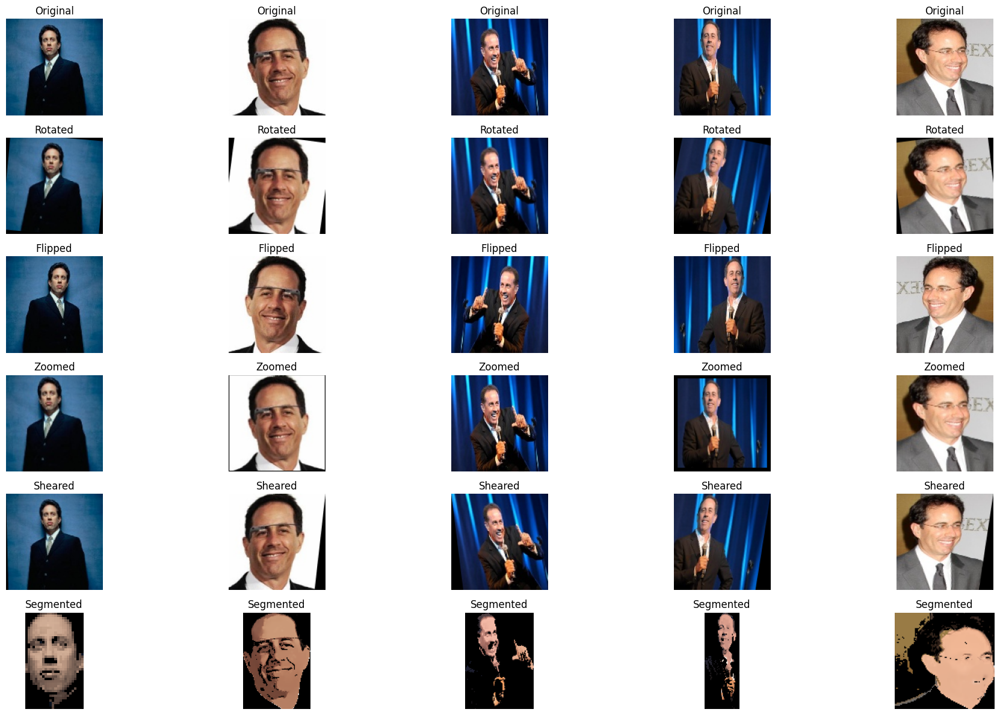

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import os
from glob import glob

# fungsi augmentasi dan segmentasi
def random_rotate(image, angle_range=20):
    angle = random.uniform(-angle_range, angle_range)
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h))
    return rotated

def horizontal_flip(image):
    return cv2.flip(image, 1)

def random_zoom(image, zoom_range=(0.8, 1.2)):
    zoom_factor = random.uniform(*zoom_range)
    h, w = image.shape[:2]
    new_h, new_w = int(h * zoom_factor), int(w * zoom_factor)
    zoomed = cv2.resize(image, (new_w, new_h))
    if zoom_factor < 1.0:
        pad_h = (h - new_h) // 2
        pad_w = (w - new_w) // 2
        zoomed = cv2.copyMakeBorder(zoomed, pad_h, h-new_h-pad_h, pad_w, w-new_w-pad_w, cv2.BORDER_CONSTANT)
    else:
        start_h = (new_h - h) // 2
        start_w = (new_w - w) // 2
        zoomed = zoomed[start_h:start_h+h, start_w:start_w+w]
    return zoomed

def random_shear(image, shear_range=0.2):
    h, w = image.shape[:2]
    shear_factor = random.uniform(-shear_range, shear_range)
    M = np.array([[1, shear_factor, 0],
                  [0, 1, 0]], dtype=np.float32)
    sheared = cv2.warpAffine(image, M, (w, h))
    return sheared

def segment_skin_meanshift(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lower = np.array([0, 40, 60], dtype=np.uint8)
    upper = np.array([20, 150, 255], dtype=np.uint8)
    mask = cv2.inRange(hsv, lower, upper)
    shifted = cv2.pyrMeanShiftFiltering(image, sp=21, sr=51)
    skin = cv2.bitwise_and(shifted, shifted, mask=mask)
    coords = cv2.findNonZero(mask)
    if coords is not None:
        x, y, w, h = cv2.boundingRect(coords)
        cropped = skin[y:y+h, x:x+w]
    else:
        cropped = image
    return cropped

sample_folder = "/content/preprocessed_dataset/jerry_seinfeld"
image_paths = glob(os.path.join(sample_folder, "*.*"))[:5]

plt.figure(figsize=(20, 12))

for i, img_path in enumerate(image_paths):
    img = cv2.imread(img_path)

    # buat versi RGB untuk matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # augmentasi
    rotated_img = random_rotate(img)
    flipped_img = horizontal_flip(img)
    zoomed_img = random_zoom(img)
    sheared_img = random_shear(img)
    segmented_img = segment_skin_meanshift(img)

    # konversi ke RGB
    rotated_rgb = cv2.cvtColor(rotated_img, cv2.COLOR_BGR2RGB)
    flipped_rgb = cv2.cvtColor(flipped_img, cv2.COLOR_BGR2RGB)
    zoomed_rgb = cv2.cvtColor(zoomed_img, cv2.COLOR_BGR2RGB)
    sheared_rgb = cv2.cvtColor(sheared_img, cv2.COLOR_BGR2RGB)
    segmented_rgb = cv2.cvtColor(segmented_img, cv2.COLOR_BGR2RGB)

    # baris 1: Original
    plt.subplot(6, 5, i+1)
    plt.imshow(img_rgb)
    if i == 0: plt.ylabel("Original", fontsize=14)
    plt.title('Original')
    plt.axis('off')

    # baris 2: Rotated
    plt.subplot(6, 5, i+6)
    plt.imshow(rotated_rgb)
    if i == 0: plt.ylabel("Rotate", fontsize=14)
    plt.title('Rotated')
    plt.axis('off')

    # baris 3: Flipped
    plt.subplot(6, 5, i+11)
    plt.imshow(flipped_rgb)
    if i == 0: plt.ylabel("Flip", fontsize=14)
    plt.title('Flipped')
    plt.axis('off')

    # baris 4: Zoomed
    plt.subplot(6, 5, i+16)
    plt.imshow(zoomed_rgb)
    if i == 0: plt.ylabel("Zoom", fontsize=14)
    plt.title('Zoomed')
    plt.axis('off')

    # baris 5: Sheared
    plt.subplot(6, 5, i+21)
    plt.imshow(sheared_rgb)
    if i == 0: plt.ylabel("Shear", fontsize=14)
    plt.title('Sheared')
    plt.axis('off')

    # baris 6: Segmented
    plt.subplot(6, 5, i+26)
    plt.imshow(segmented_rgb)
    if i == 0: plt.ylabel("Segmented", fontsize=14)
    plt.title('Segmented')
    plt.axis('off')

plt.tight_layout()
plt.show()


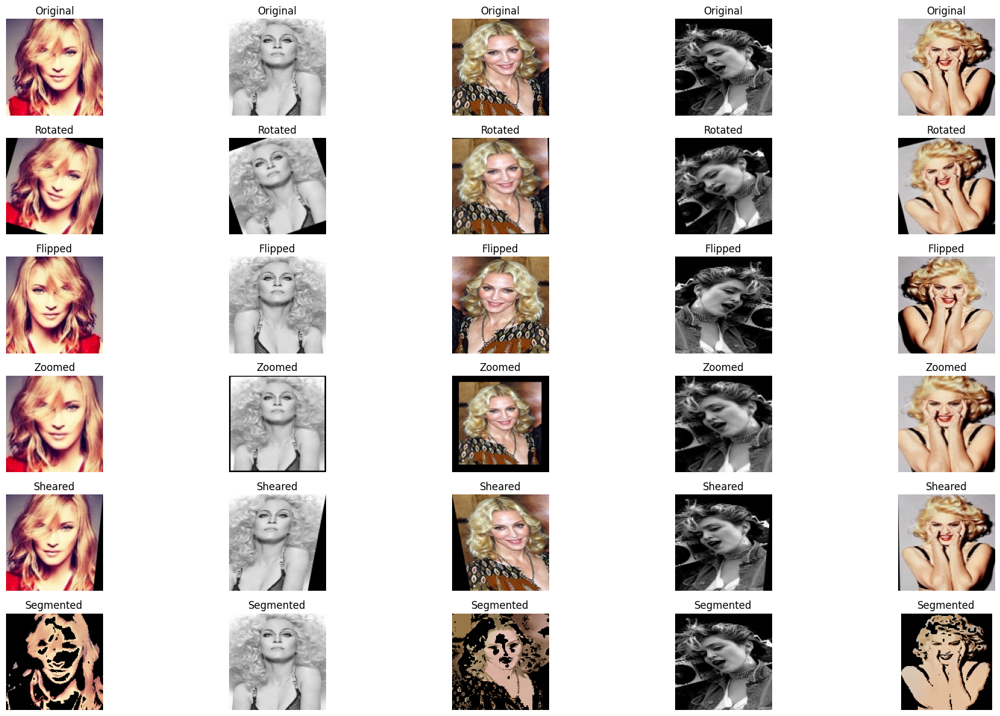

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import os
from glob import glob

# fungsi augmentasi dan segmentasi
def random_rotate(image, angle_range=20):
    angle = random.uniform(-angle_range, angle_range)
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h))
    return rotated

def horizontal_flip(image):
    return cv2.flip(image, 1)

def random_zoom(image, zoom_range=(0.8, 1.2)):
    zoom_factor = random.uniform(*zoom_range)
    h, w = image.shape[:2]
    new_h, new_w = int(h * zoom_factor), int(w * zoom_factor)
    zoomed = cv2.resize(image, (new_w, new_h))
    if zoom_factor < 1.0:
        pad_h = (h - new_h) // 2
        pad_w = (w - new_w) // 2
        zoomed = cv2.copyMakeBorder(zoomed, pad_h, h-new_h-pad_h, pad_w, w-new_w-pad_w, cv2.BORDER_CONSTANT)
    else:
        start_h = (new_h - h) // 2
        start_w = (new_w - w) // 2
        zoomed = zoomed[start_h:start_h+h, start_w:start_w+w]
    return zoomed

def random_shear(image, shear_range=0.2):
    h, w = image.shape[:2]
    shear_factor = random.uniform(-shear_range, shear_range)
    M = np.array([[1, shear_factor, 0],
                  [0, 1, 0]], dtype=np.float32)
    sheared = cv2.warpAffine(image, M, (w, h))
    return sheared

def segment_skin_meanshift(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lower = np.array([0, 40, 60], dtype=np.uint8)
    upper = np.array([20, 150, 255], dtype=np.uint8)
    mask = cv2.inRange(hsv, lower, upper)
    shifted = cv2.pyrMeanShiftFiltering(image, sp=21, sr=51)
    skin = cv2.bitwise_and(shifted, shifted, mask=mask)
    coords = cv2.findNonZero(mask)
    if coords is not None:
        x, y, w, h = cv2.boundingRect(coords)
        cropped = skin[y:y+h, x:x+w]
    else:
        cropped = image
    return cropped

sample_folder = "/content/preprocessed_dataset/madonna"
image_paths = glob(os.path.join(sample_folder, "*.*"))[:5]

plt.figure(figsize=(20, 12))

for i, img_path in enumerate(image_paths):
    img = cv2.imread(img_path)

    # buat versi RGB untuk matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # augmentasi
    rotated_img = random_rotate(img)
    flipped_img = horizontal_flip(img)
    zoomed_img = random_zoom(img)
    sheared_img = random_shear(img)
    segmented_img = segment_skin_meanshift(img)

    # konversi ke RGB
    rotated_rgb = cv2.cvtColor(rotated_img, cv2.COLOR_BGR2RGB)
    flipped_rgb = cv2.cvtColor(flipped_img, cv2.COLOR_BGR2RGB)
    zoomed_rgb = cv2.cvtColor(zoomed_img, cv2.COLOR_BGR2RGB)
    sheared_rgb = cv2.cvtColor(sheared_img, cv2.COLOR_BGR2RGB)
    segmented_rgb = cv2.cvtColor(segmented_img, cv2.COLOR_BGR2RGB)

    # baris 1: Original
    plt.subplot(6, 5, i+1)
    plt.imshow(img_rgb)
    if i == 0: plt.ylabel("Original", fontsize=14)
    plt.title('Original')
    plt.axis('off')

    # baris 2: Rotated
    plt.subplot(6, 5, i+6)
    plt.imshow(rotated_rgb)
    if i == 0: plt.ylabel("Rotate", fontsize=14)
    plt.title('Rotated')
    plt.axis('off')

    # baris 3: Flipped
    plt.subplot(6, 5, i+11)
    plt.imshow(flipped_rgb)
    if i == 0: plt.ylabel("Flip", fontsize=14)
    plt.title('Flipped')
    plt.axis('off')

    # baris 4: Zoomed
    plt.subplot(6, 5, i+16)
    plt.imshow(zoomed_rgb)
    if i == 0: plt.ylabel("Zoom", fontsize=14)
    plt.title('Zoomed')
    plt.axis('off')

    # baris 5: Sheared
    plt.subplot(6, 5, i+21)
    plt.imshow(sheared_rgb)
    if i == 0: plt.ylabel("Shear", fontsize=14)
    plt.title('Sheared')
    plt.axis('off')

    # baris 6: Segmented
    plt.subplot(6, 5, i+26)
    plt.imshow(segmented_rgb)
    if i == 0: plt.ylabel("Segmented", fontsize=14)
    plt.title('Segmented')
    plt.axis('off')

plt.tight_layout()
plt.show()


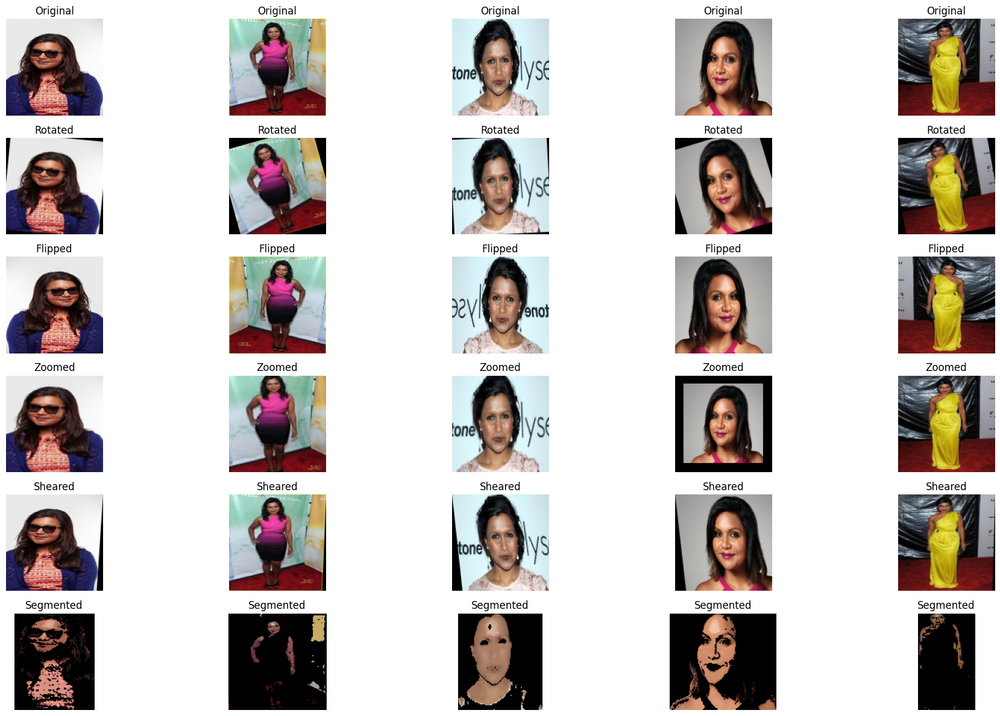

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import os
from glob import glob

# fungsi augmentasi dan segmentasi
def random_rotate(image, angle_range=20):
    angle = random.uniform(-angle_range, angle_range)
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h))
    return rotated

def horizontal_flip(image):
    return cv2.flip(image, 1)

def random_zoom(image, zoom_range=(0.8, 1.2)):
    zoom_factor = random.uniform(*zoom_range)
    h, w = image.shape[:2]
    new_h, new_w = int(h * zoom_factor), int(w * zoom_factor)
    zoomed = cv2.resize(image, (new_w, new_h))
    if zoom_factor < 1.0:
        pad_h = (h - new_h) // 2
        pad_w = (w - new_w) // 2
        zoomed = cv2.copyMakeBorder(zoomed, pad_h, h-new_h-pad_h, pad_w, w-new_w-pad_w, cv2.BORDER_CONSTANT)
    else:
        start_h = (new_h - h) // 2
        start_w = (new_w - w) // 2
        zoomed = zoomed[start_h:start_h+h, start_w:start_w+w]
    return zoomed

def random_shear(image, shear_range=0.2):
    h, w = image.shape[:2]
    shear_factor = random.uniform(-shear_range, shear_range)
    M = np.array([[1, shear_factor, 0],
                  [0, 1, 0]], dtype=np.float32)
    sheared = cv2.warpAffine(image, M, (w, h))
    return sheared

def segment_skin_meanshift(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    lower = np.array([0, 40, 60], dtype=np.uint8)
    upper = np.array([20, 150, 255], dtype=np.uint8)
    mask = cv2.inRange(hsv, lower, upper)
    shifted = cv2.pyrMeanShiftFiltering(image, sp=21, sr=51)
    skin = cv2.bitwise_and(shifted, shifted, mask=mask)
    coords = cv2.findNonZero(mask)
    if coords is not None:
        x, y, w, h = cv2.boundingRect(coords)
        cropped = skin[y:y+h, x:x+w]
    else:
        cropped = image
    return cropped

sample_folder = "/content/preprocessed_dataset/mindy_kaling"
image_paths = glob(os.path.join(sample_folder, "*.*"))[:5]

plt.figure(figsize=(20, 12))

for i, img_path in enumerate(image_paths):
    img = cv2.imread(img_path)

    # buat versi RGB untuk matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # augmentasi
    rotated_img = random_rotate(img)
    flipped_img = horizontal_flip(img)
    zoomed_img = random_zoom(img)
    sheared_img = random_shear(img)
    segmented_img = segment_skin_meanshift(img)

    # konversi ke RGB
    rotated_rgb = cv2.cvtColor(rotated_img, cv2.COLOR_BGR2RGB)
    flipped_rgb = cv2.cvtColor(flipped_img, cv2.COLOR_BGR2RGB)
    zoomed_rgb = cv2.cvtColor(zoomed_img, cv2.COLOR_BGR2RGB)
    sheared_rgb = cv2.cvtColor(sheared_img, cv2.COLOR_BGR2RGB)
    segmented_rgb = cv2.cvtColor(segmented_img, cv2.COLOR_BGR2RGB)

    # baris 1: Original
    plt.subplot(6, 5, i+1)
    plt.imshow(img_rgb)
    if i == 0: plt.ylabel("Original", fontsize=14)
    plt.title('Original')
    plt.axis('off')

    # baris 2: Rotated
    plt.subplot(6, 5, i+6)
    plt.imshow(rotated_rgb)
    if i == 0: plt.ylabel("Rotate", fontsize=14)
    plt.title('Rotated')
    plt.axis('off')

    # baris 3: Flipped
    plt.subplot(6, 5, i+11)
    plt.imshow(flipped_rgb)
    if i == 0: plt.ylabel("Flip", fontsize=14)
    plt.title('Flipped')
    plt.axis('off')

    # baris 4: Zoomed
    plt.subplot(6, 5, i+16)
    plt.imshow(zoomed_rgb)
    if i == 0: plt.ylabel("Zoom", fontsize=14)
    plt.title('Zoomed')
    plt.axis('off')

    # baris 5: Sheared
    plt.subplot(6, 5, i+21)
    plt.imshow(sheared_rgb)
    if i == 0: plt.ylabel("Shear", fontsize=14)
    plt.title('Sheared')
    plt.axis('off')

    # baris 6: Segmented
    plt.subplot(6, 5, i+26)
    plt.imshow(segmented_rgb)
    if i == 0: plt.ylabel("Segmented", fontsize=14)
    plt.title('Segmented')
    plt.axis('off')

plt.tight_layout()
plt.show()


# ekstraksi fitur

In [ ]:
import os
import cv2
import numpy as np
from glob import glob
from skimage.feature import hog
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

dataset_path = "/content/preprocessed_dataset"
classes = sorted(os.listdir(dataset_path))

# parameter HOG
hog_params = {
    'orientations': 9,
    'pixels_per_cell': (8, 8),
    'cells_per_block': (2, 2),
    'block_norm': 'L2-Hys'
}

# menyimpan fitur dan label
features = []
labels = []

# ekstraksi fitur HOG
for class_name in classes:
    class_dir = os.path.join(dataset_path, class_name)
    image_paths = glob(os.path.join(class_dir, "*.*"))

    for img_path in image_paths:
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # gunakan grayscale
        if img is None:
            continue
        hog_feature = hog(img, **hog_params)
        features.append(hog_feature)
        labels.append(class_name)

features = np.array(features)
labels = np.array(labels)
print(f"Jumlah data: {len(features)}, Dimensi fitur HOG: {features.shape[1]}")


Jumlah data: 93, Dimensi fitur HOG: 8100


In [ ]:
from sklearn.decomposition import PCA

# gunakan 95% variansi untuk menentukan jumlah komponen secara otomatis
pca = PCA(n_components=0.95)
features_pca = pca.fit_transform(features)

print(f"Dimensi fitur setelah PCA: {features_pca.shape}")

Dimensi fitur setelah PCA: (93, 83)


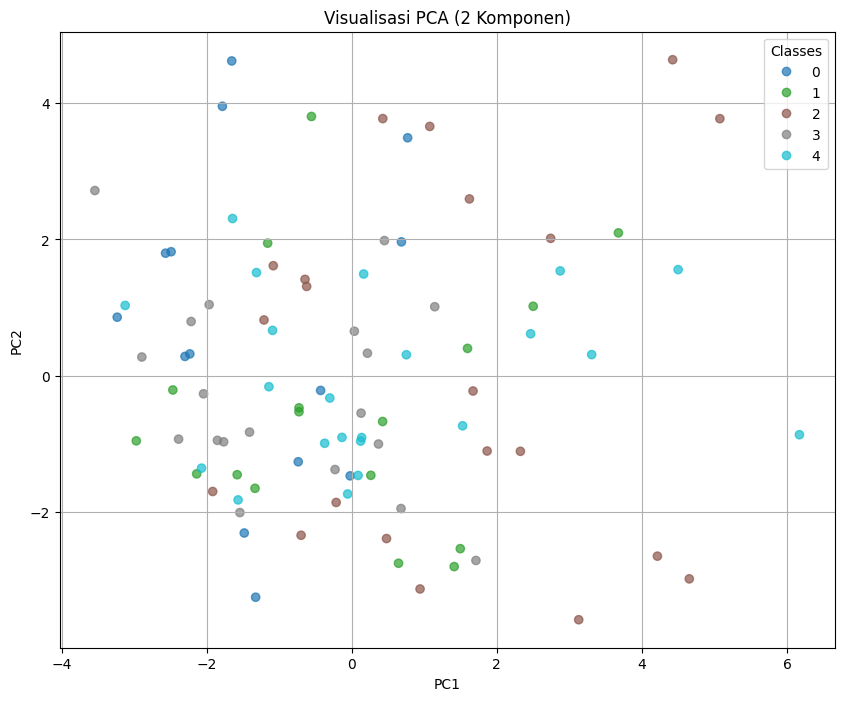

In [ ]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

# diasumsikan features_pca adalah hasil PCA dengan 2 komponen
# dan labels adalah label string (nama kelas)
le = LabelEncoder()
labels_encoded = le.fit_transform(labels)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(features_pca[:, 0], features_pca[:, 1], c=labels_encoded, cmap='tab10', alpha=0.7)
plt.xlabel("PC1")
plt.ylabel("PC2")

# perbaikan legend
handles, legend_labels = scatter.legend_elements()
plt.legend(handles, legend_labels, title="Classes")

plt.grid(True)
plt.title("Visualisasi PCA (2 Komponen)")
plt.show()


# pemodelan cnn

In [ ]:
import os
import cv2
import numpy as np
from glob import glob
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

In [ ]:
def load_images(dataset_path, img_size=(128, 128)):
    X, y = [], []
    class_names = sorted([d for d in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, d))])
    label_dict = {name: idx for idx, name in enumerate(class_names)}

    for class_name in class_names:
        class_dir = os.path.join(dataset_path, class_name)
        for img_path in glob(os.path.join(class_dir, "*.*")):
            img = cv2.imread(img_path)
            if img is None:
                continue
            img = cv2.resize(img, img_size)
            img = img / 255.0  # Normalisasi
            X.append(img)
            y.append(label_dict[class_name])

    return np.array(X), np.array(y), class_names


In [ ]:
X, y, class_names = load_images("/content/preprocessed_dataset")
y_cat = to_categorical(y, num_classes=len(class_names))

X_train, X_test, y_train, y_test = train_test_split(X, y_cat, test_size=0.2, random_state=42, stratify=y)


In [ ]:
model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(128,128,3)),
    MaxPooling2D(2,2),
    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),
    Conv2D(128, (3,3), activation='relu'),
    MaxPooling2D(2,2),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(class_names), activation='softmax')
])

model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)               │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,305,285 (12.61 MB)

 Trainable params: 3,305,285 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2)

Epoch 1/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.1972 - loss: 1.9267 - val_accuracy: 0.2000 - val_loss: 2.1504
Epoch 2/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - accuracy: 0.2546 - loss: 1.7745 - val_accuracy: 0.1333 - val_loss: 1.6573
Epoch 3/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 959ms/step - accuracy: 0.2850 - loss: 1.5322 - val_accuracy: 0.1333 - val_loss: 1.6602
Epoch 4/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 942ms/step - accuracy: 0.3754 - loss: 1.4871 - val_accuracy: 0.2000 - val_loss: 1.6907
Epoch 5/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 961ms/step - accuracy: 0.4066 - loss: 1.4210 - val_accuracy: 0.2667 - val_loss: 1.7421
Epoch 6/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - accuracy: 0.6255 - loss: 1.2508 - val_accuracy: 0.2667 - val_loss: 1.7304
Epoch 7/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.5847 - loss: 1.1059 - val_accuracy: 0.2667 - val_loss: 1.7260
Epoch 8/20
2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 936ms/step - accuracy: 0.7246 - loss: 0.9077 - val_accuracy: 0.3333 - val_loss: 1.7342
Epoc

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 379ms/step - accuracy: 0.4211 - loss: 2.3607
Akurasi di data uji: 0.4211


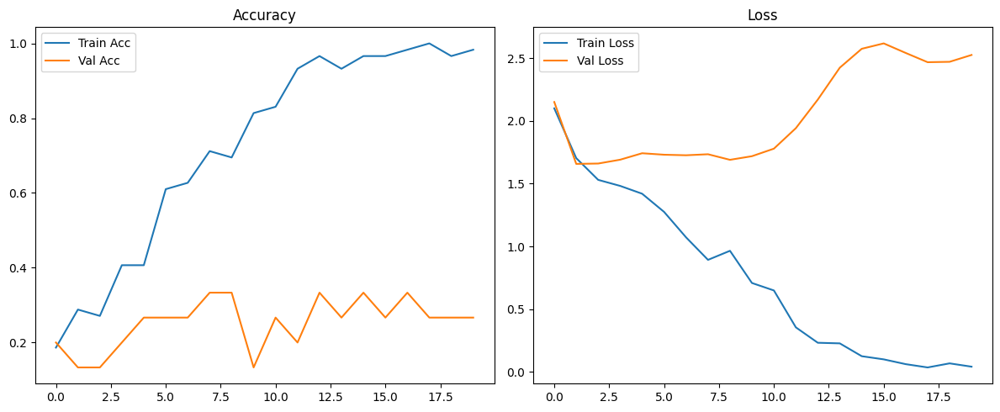

In [ ]:
# evaluasi
loss, acc = model.evaluate(X_test, y_test)
print(f"Akurasi di data uji: {acc:.4f}")

# plot akurasi dan loss
plt.figure(figsize=(12, 5))

# akurasi
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Accuracy')
plt.legend()

# loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step - accuracy: 0.4211 - loss: 2.3607
Test Accuracy: 0.4211
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step
                precision    recall  f1-score   support

    ben_afflek       0.67      0.67      0.67         3
    elton_john       0.00      0.00      0.00         3
jerry_seinfeld       0.25      0.25      0.25         4
       madonna       0.50      0.50      0.50         4
  mindy_kaling       0.43      0.60      0.50         5

      accuracy                           0.42        19
     macro avg       0.37      0.40      0.38        19
  weighted avg       0.38      0.42      0.39        19



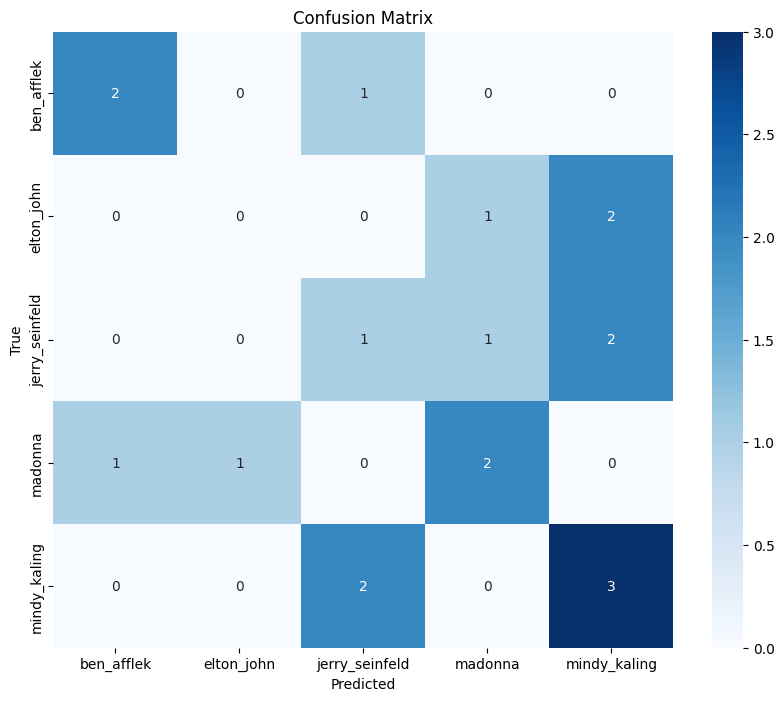

In [ ]:
# evaluasi
loss, acc = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {acc:.4f}")

# prediksi
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=1)
y_true_labels = np.argmax(y_test, axis=1)

# classification report
print(classification_report(y_true_labels, y_pred_labels, target_names=class_names))

# confusion matrix
cm = confusion_matrix(y_true_labels, y_pred_labels)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()
